# Hao_PBMC Level 2 ACT annotation result
Your JodID: 20240426150359X81TGC756JEX3E  
http://xteam.xbio.top/ACT/ResultAction.action?jobID=20240426150359X81TGC756JEX3E

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import os

/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
!ls

ACT_Annotation_L2.txt        L2_query.txt
ACT_Annotation_L2.xlsx       query.ipynb
ACT_annotation_L2_UMAP.ipynb ~$ACT_Annotation_L2.xlsx


In [3]:
annot = pd.read_csv('ACT_Annotation_L2.txt', index_col=0, sep='\t')

In [4]:
annot = annot.rename(columns={'whg.overlap': 'canonical.marker.overlap', 'gsea.overlap': 'gsea.DEG.overlap'})
annot.head(12)

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap
Order,,,,,,,,,
1,Clus_ASDC,Monocyte,5.717895e-15,3.035661e-18,0.188797,8/218,10/365,"CD52,S100A9,SAT1,TXN,MALAT1,ANXA2,CST3,FTL","CD52,S100A10,S100A9,PLAC8,SAT1,ANXA2,CST3,SAMH..."
2,Clus_ASDC,Dendritic cell,1.574161e-14,2.549220e-17,0.129032,10/143,16/307,"CD52,S100A9,PLAC8,TXN,IRF8,TCF4,CST3,PPP1R14A,...","CD52,S100A10,PLAC8,TMSB4X,SAT1,TXN,B2M,ANXA2,R..."
3,Clus_ASDC,Plasmacytoid dendritic cell,1.640544e-12,1.942550e-13,0.003028,6/93,9/295,"CCDC50,PLAC8,SOX4,IRF8,TCF4,CST3","CCDC50,PLAC8,SOX4,PLP2,TXN,C12orf75,IRF8,TCF4,APP"
4,Clus_ASDC,Suppressor macrophage,1.302398e-09,2.245514e-11,NaN,2/16,0/1,"S100A9,CST3",NaN
5,Clus_ASDC,Classical monocyte,2.485742e-09,5.357203e-11,NaN,3/122,2/66,"S100A9,PLAC8,CST3","S100A9,CST3"
6,Clus_ASDC,Neutrophil,2.144092e-08,5.545065e-10,NaN,3/117,4/280,"S100A9,PLAC8,CST3","S100A9,PLAC8,TXN,RPLP1"
7,Clus_ASDC,CD1c-positive myeloid dendritic cell,4.016572e-08,1.211897e-09,NaN,2/15,2/35,"S100A9,CST3","S100A9,CST3"
8,Clus_ASDC,Macrophage,3.542767e-07,4.110125e-09,0.150602,8/281,14/653,"CD52,S100A9,SAT1,B2M,CST3,FTL,MT-ND2,MT-CO3","CD52,S100A10,S100A9,PLAC8,TMSB4X,SAT1,B2M,ANXA..."
9,Clus_ASDC,Monocyte-derived dendritic cell,1.633992e-04,6.552043e-06,0.068856,2/26,8/577,"S100A9,CST3","CCDC50,TMSB4X,SAT1,TXN,B2M,ANXA2,PPP1R14A,FTL"


In [5]:
annot['canonical.marker.overlap'] = annot['canonical.marker.overlap'].str.split(',').fillna('')
annot['gsea.DEG.overlap'] = annot['gsea.DEG.overlap'].str.split(',').fillna('')

In [6]:
annot['union'] = annot.apply(lambda row: list(set(row['canonical.marker.overlap']) | set(row['gsea.DEG.overlap'])), axis=1)
annot.head(12)

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,Clus_ASDC,Monocyte,5.717895e-15,3.035661e-18,0.188797,8/218,10/365,"[CD52, S100A9, SAT1, TXN, MALAT1, ANXA2, CST3,...","[CD52, S100A10, S100A9, PLAC8, SAT1, ANXA2, CS...","[PLAC8, S100A9, ANXA2, S100A10, SAMHD1, MALAT1..."
2,Clus_ASDC,Dendritic cell,1.574161e-14,2.549220e-17,0.129032,10/143,16/307,"[CD52, S100A9, PLAC8, TXN, IRF8, TCF4, CST3, P...","[CD52, S100A10, PLAC8, TMSB4X, SAT1, TXN, B2M,...","[PLAC8, PPP1R14A, SAMHD1, RPLP1, TXN, TCF4, SA..."
3,Clus_ASDC,Plasmacytoid dendritic cell,1.640544e-12,1.942550e-13,0.003028,6/93,9/295,"[CCDC50, PLAC8, SOX4, IRF8, TCF4, CST3]","[CCDC50, PLAC8, SOX4, PLP2, TXN, C12orf75, IRF...","[PLAC8, SOX4, C12orf75, PLP2, TCF4, TXN, IRF8,..."
4,Clus_ASDC,Suppressor macrophage,1.302398e-09,2.245514e-11,NaN,2/16,0/1,"[S100A9, CST3]",,"[S100A9, CST3]"
5,Clus_ASDC,Classical monocyte,2.485742e-09,5.357203e-11,NaN,3/122,2/66,"[S100A9, PLAC8, CST3]","[S100A9, CST3]","[PLAC8, S100A9, CST3]"
6,Clus_ASDC,Neutrophil,2.144092e-08,5.545065e-10,NaN,3/117,4/280,"[S100A9, PLAC8, CST3]","[S100A9, PLAC8, TXN, RPLP1]","[PLAC8, S100A9, TXN, RPLP1, CST3]"
7,Clus_ASDC,CD1c-positive myeloid dendritic cell,4.016572e-08,1.211897e-09,NaN,2/15,2/35,"[S100A9, CST3]","[S100A9, CST3]","[S100A9, CST3]"
8,Clus_ASDC,Macrophage,3.542767e-07,4.110125e-09,0.150602,8/281,14/653,"[CD52, S100A9, SAT1, B2M, CST3, FTL, MT-ND2, M...","[CD52, S100A10, S100A9, PLAC8, TMSB4X, SAT1, B...","[PLAC8, SAMHD1, MT-ND2, FCGRT, SAT1, AXL, CST3..."
9,Clus_ASDC,Monocyte-derived dendritic cell,1.633992e-04,6.552043e-06,0.068856,2/26,8/577,"[S100A9, CST3]","[CCDC50, TMSB4X, SAT1, TXN, B2M, ANXA2, PPP1R1...","[S100A9, ANXA2, PPP1R14A, B2M, TXN, FTL, TMSB4..."


## Plot UMAP for marker genes (intersection with PreLect)

In [7]:
adata = sc.read_h5ad('/Users/evanli/Documents/Research_datasets/PBMC_Hao/GSE164378_Hao/batch_corrected/Hao_PBMC_Harmony_unscaled.h5ad')
adata.obs['celltype.l2'] = adata.obs['celltype.l2'].str.replace(' ', '_')
labels = adata.obs['celltype.l2']
types = np.unique(labels).tolist()
types

['ASDC',
 'B_intermediate',
 'B_memory',
 'B_naive',
 'CD14_Mono',
 'CD16_Mono',
 'CD4_CTL',
 'CD4_Naive',
 'CD4_Proliferating',
 'CD4_TCM',
 'CD4_TEM',
 'CD8_Naive',
 'CD8_Proliferating',
 'CD8_TCM',
 'CD8_TEM',
 'Doublet',
 'Eryth',
 'HSPC',
 'ILC',
 'MAIT',
 'NK',
 'NK_CD56bright',
 'NK_Proliferating',
 'Plasmablast',
 'Platelet',
 'Treg',
 'cDC1',
 'cDC2',
 'dnT',
 'gdT',
 'pDC']

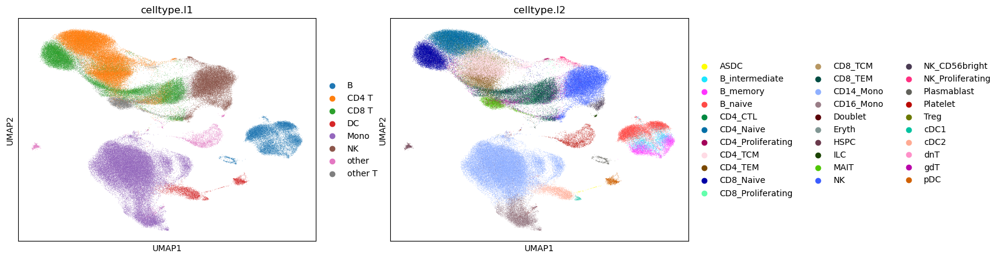

In [8]:
# UMAP embedding in adata
sc.pl.umap(adata, color=['celltype.l1', 'celltype.l2'], legend_loc="right margin")

## Plot UMAP of L2 overlapped marker genes (if celltype matched)

### B_memory 

In [11]:
annot[annot['Cluster']=='Clus_B_memory']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,Clus_B_memory,Memory B cell,7.724690e-18,2.066434e-20,0.065702,8/39,9/44,"[AIM2, BANK1, CD74, HLA-DRA, BLK, MS4A1, IGHG1...","[TXNIP, TMSB10, IGKC, BANK1, CD74, HLA-DRA, MS...","[BLK, IGHM, BANK1, TMSB10, HLA-DRA, TXNIP, BTG..."
2,Clus_B_memory,Granulocyte,2.530130e-17,3.271720e-19,NaN,9/69,2/40,"[PTPRC, IGKC, BANK1, CD74, HLA-DRA, MS4A1, LYZ...","[HLA-DRA, FTH1]","[IGHM, BANK1, HLA-DRA, LYZ, CD74, IGHA1, PTPRC..."
3,Clus_B_memory,Plasma cell,7.223607e-16,6.031139e-18,0.047253,6/64,6/333,"[PTPRC, IGKC, MS4A1, IGHA1, IGHG1, IGHM]","[IGKC, CD74, IGHA1, IGHG1, IGHM, B2M]","[IGHM, B2M, IGHA1, CD74, PTPRC, IGHG1, IGKC, M..."
4,Clus_B_memory,Macrophage,2.271533e-13,9.551767e-16,0.164493,8/281,15/653,"[CTSS, PTPRC, CD74, HLA-DRA, FTH1, LYZ, BTG1, ...","[TXNIP, CTSS, PTPRC, TMSB10, CD74, HLA-DRA, MA...","[MARCKS, TXNIP, CTSS, CD74, FTH1, LYZ, SERF2, ..."
5,Clus_B_memory,Monocyte,1.351735e-12,6.666746e-14,0.017283,7/218,14/365,"[CTSS, PTPRC, CD74, HLA-DRA, FTH1, MALAT1, LYZ]","[TXNIP, CTSS, PTPRC, TMSB10, IGKC, CD74, LTB, ...","[MARCKS, TXNIP, CTSS, CD74, FTH1, LYZ, IGKC, S..."
6,Clus_B_memory,Dendritic cell,8.593860e-12,9.159641e-13,0.009700,6/143,11/307,"[PTPRC, IGKC, CD74, LTB, HLA-DRA, LYZ]","[CTSS, PTPRC, TMSB10, CD74, HLA-DRA, MARCKS, T...","[MARCKS, CTSS, CD74, FTH1, IGKC, LYZ, SERF2, T..."
7,Clus_B_memory,"Central memory CD4-positive, alpha-beta T cell",9.287877e-11,3.626296e-12,NaN,5/28,0/1,"[PTPRC, TMSB10, CD74, LTB, ITGB1]",,"[ITGB1, CD74, PTPRC, TMSB10, LTB]"
8,Clus_B_memory,Mesenchymal stem cell,1.113241e-10,3.975867e-13,0.436975,4/145,6/326,"[PTPRC, CD74, HLA-DRA, ITGB1]","[TMSB10, MARCKS, FTH1, MALAT1, MYL6, SERF2]","[ITGB1, SERF2, MARCKS, TMSB10, HLA-DRA, MALAT1..."
9,Clus_B_memory,Memory T cell,4.093863e-08,2.607004e-10,0.336226,2/19,8/214,"[PTPRC, LTB]","[TXNIP, PTPRC, LTB, FTH1, MALAT1, ITGB1, ARID5...","[ITGB1, MALAT1, TXNIP, BTG1, ARID5B, PTPRC, FT..."


['AIM2', 'BANK1', 'CD74', 'HLA-DRA', 'BLK', 'MS4A1', 'IGHG1', 'IGHM']


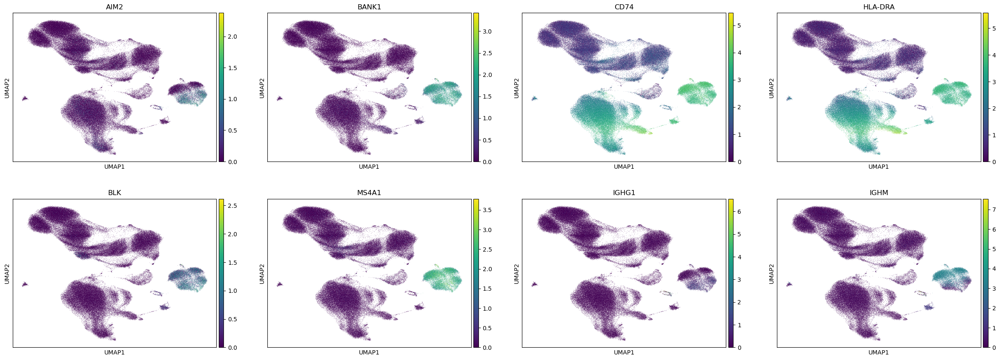

In [12]:
Bm_canon = annot[(annot['Cluster']=='Clus_B_memory') & (annot['Cell.Type']=='Memory B cell')]['canonical.marker.overlap'].tolist()[0]
print(Bm_canon)
sc.pl.umap(adata, color=Bm_canon)

### B_naive

In [13]:
annot[annot['Cluster']=='Clus_B_naive']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,Clus_B_naive,Naive B cell,7.750432e-22,2.549058e-24,0.022162,4/22,5/66,"[MS4A1, TCL1A, IGHD, IGHM]","[HLA-DRA, MS4A1, TCL1A, IGHD, IGHM]","[IGHM, IGHD, HLA-DRA, TCL1A, MS4A1]"
2,Clus_B_naive,B cell,1.413755e-19,1.491794e-20,0.002325,6/169,8/264,"[CXCR4, HLA-DRA, MS4A1, TCL1A, IGHD, IGHM]","[CXCR4, HLA-DRA, MS4A1, MALAT1, TCL1A, IGHD, I...","[IGHM, IGHD, B2M, HLA-DRA, MALAT1, TCL1A, MS4A..."
3,Clus_B_naive,Memory B cell,2.917350e-18,1.567789e-20,0.065031,5/39,5/44,"[HLA-DRA, MS4A1, TCL1A, IGHD, IGHM]","[HLA-DRA, MS4A1, TCL1A, IGHD, IGHM]","[IGHM, IGHD, HLA-DRA, TCL1A, MS4A1]"
4,Clus_B_naive,Granulocyte,2.193239e-09,4.726809e-11,NaN,4/69,1/40,"[HLA-DRA, MS4A1, IGHD, IGHM]",[HLA-DRA],"[IGHM, MS4A1, IGHD, HLA-DRA]"
5,Clus_B_naive,"Effector memory CD8-positive, alpha-beta T cell",4.850099e-09,1.463392e-10,NaN,2/47,2/78,"[CXCR4, HLA-DRA]","[IGHM, B2M]","[B2M, HLA-DRA, IGHM, CXCR4]"
6,Clus_B_naive,Pro-B cell,4.850099e-09,5.495898e-12,0.937500,4/17,5/73,"[HLA-DRA, MS4A1, TCL1A, IGHM]","[CXCR4, HLA-DRA, TCL1A, IGHD, IGHM]","[IGHM, IGHD, HLA-DRA, TCL1A, MS4A1, CXCR4]"
7,Clus_B_naive,Monocyte,4.708805e-07,2.029657e-08,NaN,3/218,1/365,"[CXCR4, HLA-DRA, MALAT1]",[HLA-DRA],"[MALAT1, HLA-DRA, CXCR4]"
8,Clus_B_naive,Plasmacytoid dendritic cell,6.137493e-07,2.910018e-08,NaN,4/93,4/295,"[HLA-DRA, MS4A1, TCL1A, IGHD]","[CXCR4, HLA-DRA, TCL1A, IGHM]","[IGHM, IGHD, HLA-DRA, TCL1A, MS4A1, CXCR4]"
9,Clus_B_naive,Endothelial cell,3.770630e-04,2.600435e-05,NaN,4/466,3/268,"[CXCR4, HLA-DRA, MALAT1, B2M]","[HLA-DRA, MALAT1, B2M]","[B2M, MALAT1, HLA-DRA, CXCR4]"


['MS4A1', 'TCL1A', 'IGHD', 'IGHM']


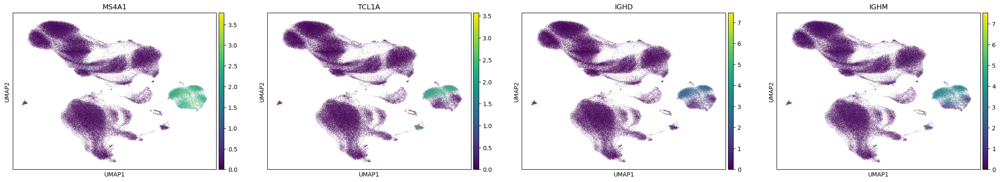

In [14]:
B_naive_canon = annot[(annot['Cluster']=='Clus_B_naive') & (annot['Cell.Type']=='Naive B cell')]['canonical.marker.overlap'].tolist()[0]
print(B_naive_canon)
sc.pl.umap(adata, color=B_naive_canon)

### CD14_mono 

In [16]:
annot[annot['Cluster']=='Clus_CD14_Mono']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,Clus_CD14_Mono,CD14-positive monocyte,1.187928e-53,3.366954e-55,0.002295,6/25,9/155,"[S100A9, S100A8, VCAN, CD14, FCN1, LYZ]","[CTSS, S100A9, S100A8, VCAN, CD14, FCN1, NEAT1...","[S100A9, VCAN, S100A8, CD14, CTSS, FCN1, LYZ, ..."
2,Clus_CD14_Mono,Monocyte,1.187928e-53,5.882871e-55,0.001126,10/218,9/365,"[CTSS, S100A9, S100A8, VCAN, CD14, FCN1, NEAT1...","[CTSS, S100A9, S100A8, VCAN, CD14, FCN1, NEAT1...","[VCAN, S100A8, CTSS, LYZ, NFKBIA, NEAT1, S100A..."
3,Clus_CD14_Mono,Classical monocyte,2.069293e-38,5.690369e-40,0.004863,7/122,7/66,"[S100A9, S100A8, VCAN, CD14, FCN1, NEAT1, LYZ]","[CTSS, S100A9, S100A8, VCAN, CD14, FCN1, LYZ]","[S100A9, VCAN, S100A8, CD14, CTSS, FCN1, LYZ, ..."
4,Clus_CD14_Mono,Suppressor macrophage,3.585982e-26,6.182727e-28,NaN,4/16,0/1,"[S100A9, S100A8, CD14, LYZ]",,"[S100A9, S100A8, CD14, LYZ]"
5,Clus_CD14_Mono,Macrophage,8.249692e-23,1.263757e-25,0.235354,11/281,12/653,"[CTSS, S100A9, S100A8, RPS27, VCAN, CD14, FCN1...","[CTSS, S100A9, S100A8, RPS27, VCAN, CD14, TMSB...","[VCAN, S100A8, CTSS, LYZ, NFKBIA, NEAT1, S100A..."
6,Clus_CD14_Mono,Neutrophil,9.575185e-21,3.303287e-23,0.136917,4/117,10/280,"[S100A9, S100A8, CD14, LYZ]","[CTSS, S100A9, S100A8, RPS27, CD14, RPS18, FCN...","[RPS29, S100A9, RPS18, RPS19, S100A8, CD14, CT..."
7,Clus_CD14_Mono,Intermediate monocyte,5.449850e-20,3.461686e-22,0.089924,5/21,8/168,"[S100A9, S100A8, CD14, FCN1, LYZ]","[CTSS, S100A9, S100A8, VCAN, RPS18, FCN1, NEAT...","[S100A9, RPS18, S100A8, VCAN, CD14, CTSS, FCN1..."
8,Clus_CD14_Mono,CD1c-positive myeloid dendritic cell,1.551414e-18,5.349703e-20,NaN,4/15,4/35,"[S100A9, S100A8, VCAN, LYZ]","[S100A9, S100A8, VCAN, LYZ]","[S100A9, VCAN, S100A8, LYZ]"
9,Clus_CD14_Mono,Myeloid suppressor cell,6.876836e-16,2.229861e-15,0.000310,5/41,12/446,"[S100A9, S100A8, VCAN, CD14, FCN1]","[CTSS, S100A9, S100A8, VCAN, CD14, TMSB4X, FCN...","[VCAN, S100A8, CTSS, LYZ, NFKBIA, NEAT1, S100A..."


['S100A9', 'S100A8', 'VCAN', 'CD14', 'FCN1', 'LYZ']


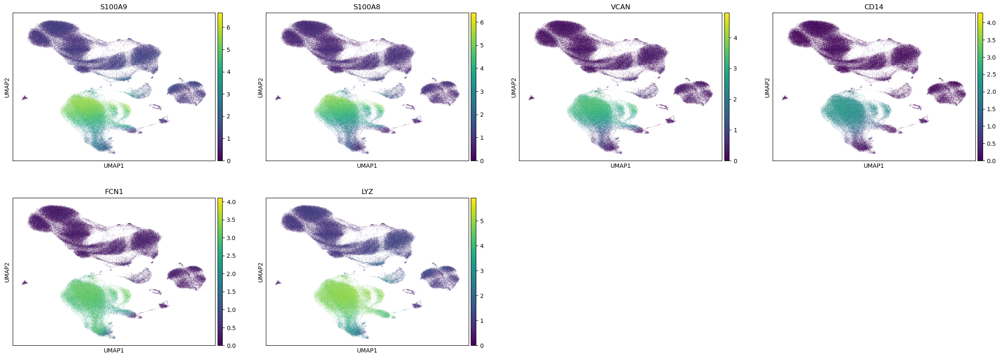

In [17]:
cd14_mono_canon = annot[(annot['Cluster']=='Clus_CD14_Mono') & (annot['Cell.Type']=='CD14-positive monocyte')]['canonical.marker.overlap'].tolist()[0]
print(cd14_mono_canon)
sc.pl.umap(adata, color=cd14_mono_canon)

### CD16_mono 

In [18]:
annot[annot['Cluster']=='Clus_CD16_Mono']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,Clus_CD16_Mono,CD14-positive monocyte,2.447761e-31,2.110139e-33,NaN,4/25,4/155,"[S100A9, S100A8, FCGR3A, MS4A7]","[S100A9, S100A8, LST1, AIF1]","[S100A9, AIF1, S100A8, FCGR3A, MS4A7, LST1]"
2,Clus_CD16_Mono,Neutrophil,2.921041e-26,4.287240e-29,0.128866,3/117,9/280,"[S100A9, S100A8, FCGR3A]","[S100A9, S100A8, RPS27, FCGR3A, LST1, AIF1, RP...","[S100A9, AIF1, S100A8, RPLP1, FCGR3A, RPS27, R..."
3,Clus_CD16_Mono,Suppressor macrophage,2.844855e-23,4.904923e-25,NaN,3/16,0/1,"[S100A9, S100A8, FCGR3A]",,"[S100A9, FCGR3A, S100A8]"
4,Clus_CD16_Mono,"CD14-positive, CD16-positive monocyte",2.108386e-18,4.073213e-19,0.002718,3/9,5/188,"[S100A9, S100A8, FCGR3A]","[FCGR3A, LST1, AIF1, MS4A7, CFD]","[S100A9, AIF1, S100A8, CFD, FCGR3A, MS4A7, LST1]"
5,Clus_CD16_Mono,Classical monocyte,2.108386e-18,4.804007e-20,NaN,3/122,2/66,"[S100A9, S100A8, FCGR3A]","[S100A9, S100A8]","[S100A9, S100A8, FCGR3A]"
6,Clus_CD16_Mono,Macrophage,3.936387e-16,1.923743e-18,0.141117,9/281,10/653,"[S100A9, S100A8, RPS27, FCGR3A, LST1, AIF1, MS...","[S100A9, S100A8, RPS27, FCGR3A, LST1, AIF1, TM...","[AIF1, S100A8, FCGR3A, MS4A7, S100A9, B2M, CFD..."
7,Clus_CD16_Mono,Intermediate monocyte,2.527820e-15,1.692040e-17,0.123510,3/21,8/168,"[S100A9, S100A8, FCGR3A]","[S100A9, S100A8, FCGR3A, LST1, AIF1, RPS18, MS...","[S100A9, RPS18, AIF1, S100A8, CFD, FCGR3A, MS4..."
8,Clus_CD16_Mono,"CD14-low, CD16-positive monocyte",9.774943e-15,3.792004e-16,NaN,2/4,4/93,"[FCGR3A, MS4A7]","[FCGR3A, LST1, AIF1, CFD]","[LST1, AIF1, MS4A7, CFD, FCGR3A]"
9,Clus_CD16_Mono,Non-classical monocyte,2.146755e-13,1.715255e-14,0.014611,3/52,5/72,"[FCGR3A, LST1, AIF1]","[FCGR3A, LST1, AIF1, MS4A7, CFD]","[AIF1, CFD, FCGR3A, MS4A7, LST1]"


['S100A9', 'S100A8', 'FCGR3A']


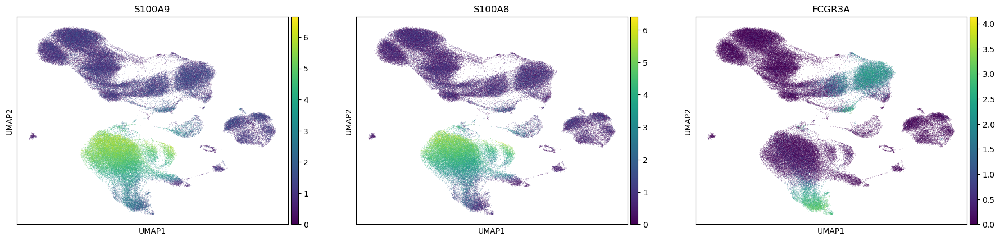

In [19]:
cd16_mono_canon = annot[(annot['Cluster']=='Clus_CD16_Mono') & (annot['Cell.Type']=='CD14-positive, CD16-positive monocyte')]['canonical.marker.overlap'].tolist()[0]
print(cd16_mono_canon)
sc.pl.umap(adata, color=cd16_mono_canon)

### CD4_proliferating

In [21]:
annot[annot['Cluster']=='Clus_CD4_Proliferating']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,Clus_CD4_Proliferating,"Proliferating CD4-positive, alpha-beta T cell",7.802740e-21,3.320315e-22,NaN,3/3,0/1,"[STMN1, MKI67, TUBA1B]",,"[MKI67, TUBA1B, STMN1]"
2,Clus_CD4_Proliferating,"CD8-positive, alpha-beta T cell",5.300067e-13,1.165585e-11,0.000082,7/96,16/293,"[STMN1, TRBC2, MKI67, TRAC, CCL5, TOP2A, NKG7]","[STMN1, HMGB2, TUBB, TRBC2, MALAT1, CD3D, MKI6...","[CD3D, NKG7, HMGB2, TOP2A, COTL1, TRBC2, TUBA1..."
3,Clus_CD4_Proliferating,"CD4-positive, alpha-beta T cell",2.569292e-11,1.347235e-11,0.005187,7/93,9/281,"[STMN1, MKI67, TRAC, COTL1, CCL5, TOP2A, NKG7]","[TXNIP, RPS27, TRBC2, MALAT1, CD3D, TRAC, IL32...","[CD3D, NKG7, TXNIP, COTL1, TOP2A, TRBC2, MKI67..."
4,Clus_CD4_Proliferating,"CD8-positive, alpha-beta cytotoxic T cell",3.944588e-11,2.976383e-11,0.004605,6/51,12/175,"[STMN1, HMGB2, TUBB, PCLAF, CCL5, NKG7]","[TXNIP, RPS27, HMGB2, TRBC2, MALAT1, CD3D, TRA...","[CD3D, NKG7, HMGB2, TXNIP, COTL1, TRBC2, TUBB,..."
5,Clus_CD4_Proliferating,"Effector memory CD8-positive, alpha-beta T cell",5.086101e-10,6.492895e-11,NaN,5/44,3/78,"[MKI67, TRAC, CCL5, TOP2A, NKG7]","[B2M, CCL5, NKG7]","[TRAC, MKI67, TOP2A, B2M, NKG7, CCL5]"
6,Clus_CD4_Proliferating,Gamma-delta T cell,1.781806e-06,2.258228e-07,0.061554,4/35,16/308,"[MKI67, CCL5, TOP2A, NKG7]","[STMN1, TXNIP, RPS27, HMGB2, TUBB, TRBC2, MALA...","[CD3D, NKG7, HMGB2, TXNIP, TOP2A, TRBC2, TUBA1..."
7,Clus_CD4_Proliferating,Mature NK T cell,1.322140e-05,3.456274e-05,0.004386,3/39,8/141,"[IL32, CCL5, NKG7]","[TXNIP, TRBC2, MALAT1, CD3D, TRAC, IL32, CCL5,...","[IL32, CD3D, NKG7, MALAT1, TXNIP, TRAC, TRBC2,..."
8,Clus_CD4_Proliferating,Effector T cell,1.515258e-04,7.312312e-06,0.315376,3/48,6/67,"[TXNIP, CCL5, NKG7]","[MALAT1, CD3D, TRAC, IL32, CCL5, NKG7]","[IL32, CD3D, NKG7, TXNIP, MALAT1, TRAC, CCL5]"
9,Clus_CD4_Proliferating,"Effector memory CD45RA-positive, alpha-beta T ...",2.979764e-04,9.951419e-05,0.053305,2/13,8/243,"[CCL5, NKG7]","[TXNIP, MALAT1, CD3D, B2M, IL32, CCL5, ACTG1, ...","[IL32, CD3D, B2M, NKG7, MALAT1, TXNIP, ACTG1, ..."


['STMN1', 'MKI67', 'TUBA1B']


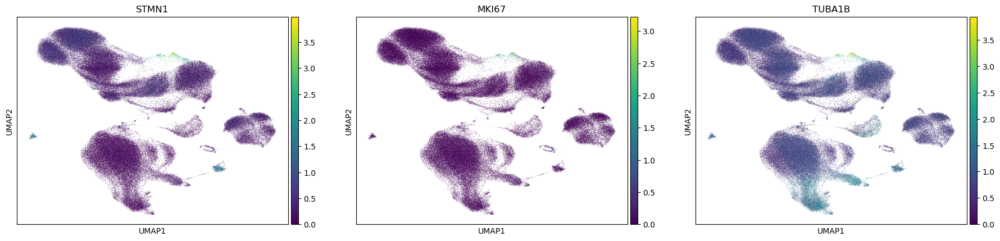

In [22]:
cd4_pro_canon = annot[(annot['Cluster']=='Clus_CD4_Proliferating') & (annot['Cell.Type']=='Proliferating CD4-positive, alpha-beta T cell')]['canonical.marker.overlap'].tolist()[0]
print(cd4_pro_canon)
sc.pl.umap(adata, color=cd4_pro_canon)

### CD4_TCM

In [23]:
annot[annot['Cluster']=='Clus_CD4_TCM']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,Clus_CD4_TCM,"Central memory CD4-positive, alpha-beta T cell",1.101290e-23,2.343170e-25,NaN,6/25,0/1,"[SELL, TMSB10, MAL, IL7R, CD74, LTB]",,"[SELL, CD74, IL7R, TMSB10, LTB, MAL]"
2,Clus_CD4_TCM,T cell,1.868469e-19,9.014806e-22,0.172205,8/221,17/225,"[CD52, CD2, S100A9, SELL, ID2, IL7R, TCF7, LTB]","[CD52, CD2, S100A4, SELL, ID2, MAL, DUSP2, PTM...","[S100A4, HLA-E, HINT1, TCF7, MAL, PTMA, HLA-C,..."
3,Clus_CD4_TCM,Central memory T cell,1.174000e-16,7.493615e-18,NaN,3/7,0/1,"[SELL, IL7R, TCF7]",,"[SELL, TCF7, IL7R]"
4,Clus_CD4_TCM,Naive T cell,1.726949e-15,7.289154e-18,0.489712,3/19,12/192,"[SELL, IL7R, TCF7]","[CD52, CD2, TXNIP, S100A11, S100A4, SELL, MAL,...","[S100A4, IL7R, TOMM7, S100A11, TCF7, TXNIP, CD..."
5,Clus_CD4_TCM,"CD4-positive, alpha-beta T cell",4.588466e-14,3.583612e-14,0.003625,6/93,16/281,"[CD2, SELL, ID2, IL7R, TCF7, LTB]","[CD52, CD2, TXNIP, S100A4, SELL, ID2, MAL, DUS...","[S100A4, PIK3R1, TCF7, TXNIP, MAL, CD74, CD2, ..."
6,Clus_CD4_TCM,"CD4-positive, alpha-beta memory T cell",2.924030e-11,2.940668e-12,0.041295,3/10,6/44,"[S100A4, SELL, IL7R]","[TXNIP, SELL, MAL, IL7R, TCF7, LTB]","[S100A4, IL7R, TXNIP, TCF7, MAL, SELL, LTB]"
7,Clus_CD4_TCM,"CD8-positive, alpha-beta memory T cell",3.378900e-11,3.167258e-12,0.052213,2/8,6/58,"[SELL, IL7R]","[CD52, CD2, TXNIP, S100A4, SELL, TMSB10]","[S100A4, IL7R, TMSB10, TXNIP, CD52, SELL, CD2]"
8,Clus_CD4_TCM,Mature NK T cell,2.074759e-10,2.144211e-12,0.579651,5/39,11/141,"[CD52, CD2, SELL, IL7R, TCF7]","[CD52, CD2, TXNIP, SELL, ID2, MAL, DUSP2, IL7R...","[TCF7, TXNIP, MAL, CD2, IL7R, HLA-B, ID2, DUSP..."
9,Clus_CD4_TCM,"CD8-positive, alpha-beta T cell",4.512273e-10,4.458688e-10,0.007051,6/96,10/293,"[CD2, S100A9, SELL, DUSP2, IL7R, LTB]","[CD52, CD2, S100A4, ID2, DUSP2, IL7R, PIK3R1, ...","[S100A4, PIK3R1, HLA-C, CD2, S100A9, IL7R, ID2..."


['SELL', 'TMSB10', 'MAL', 'IL7R', 'CD74', 'LTB']


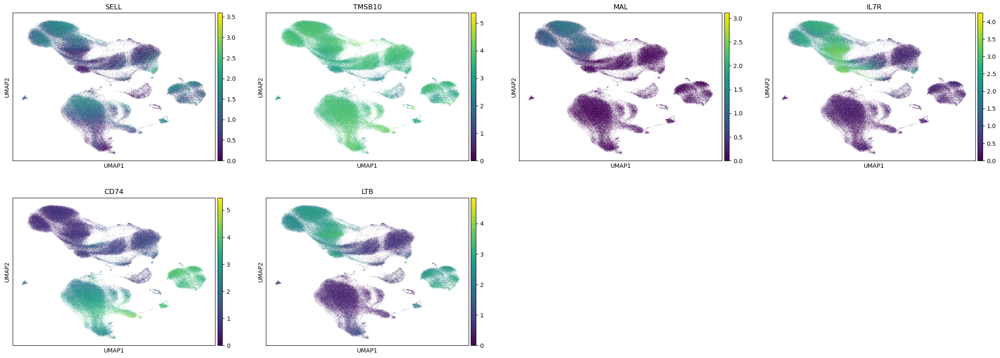

In [24]:
cd4_tcm_canon = annot[(annot['Cluster']=='Clus_CD4_TCM') & (annot['Cell.Type']=='Central memory CD4-positive, alpha-beta T cell')]['canonical.marker.overlap'].tolist()[0]
# Central memory CD4-positive, alpha-beta T cell
print(cd4_tcm_canon)
sc.pl.umap(adata, color=cd4_tcm_canon)

### CD4_TEM

In [25]:
annot[annot['Cluster']=='Clus_CD4_TEM']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,Clus_CD4_TEM,"CD8-positive, alpha-beta cytotoxic T cell",9.173008e-17,5.905839e-19,0.147239,5/51,12/175,"[CD2, GNLY, GZMK, GZMA, ANXA1]","[CD2, ZFP36L2, GNLY, LYAR, IL7R, GZMK, GZMA, H...","[GNLY, ANXA1, LYAR, KLF6, GZMA, CD2, IL7R, GZM..."
2,Clus_CD4_TEM,"CD4-positive, alpha-beta T cell",2.093403e-16,2.819958e-17,0.014579,8/93,13/281,"[CD2, GNLY, IL7R, GZMK, GZMA, LTB, TNFAIP3, AN...","[CD2, S100A4, ZFP36L2, GNLY, IL7R, GZMK, GZMA,...","[S100A4, GNLY, ANXA1, KLF6, CD2, GZMA, TNFAIP3..."
3,Clus_CD4_TEM,"Effector memory CD4-positive, alpha-beta T cell",2.093403e-16,1.385517e-17,NaN,5/26,0/1,"[GNLY, IL7R, GZMK, GZMA, ANXA1]",,"[IL7R, GZMK, GNLY, GZMA, ANXA1]"
4,Clus_CD4_TEM,"Central memory CD4-positive, alpha-beta T cell",3.010367e-15,3.202519e-16,NaN,5/25,0/1,"[ZFP36L2, TMSB10, IL7R, LTB, ANXA1]",,"[IL7R, TMSB10, ZFP36L2, LTB, ANXA1]"
5,Clus_CD4_TEM,Mature NK T cell,1.344767e-13,4.289080e-15,0.110302,4/39,10/141,"[CD2, GNLY, IL7R, GZMA]","[CD2, GNLY, LYAR, IL7R, GZMK, GZMA, LTB, TNFAI...","[TNFAIP3, IL7R, GZMK, GNLY, MALAT1, CD2, ACTB,..."
6,Clus_CD4_TEM,"CD8-positive, alpha-beta T cell",6.562964e-13,6.153511e-14,0.046046,7/96,17/293,"[CD2, S100A10, GNLY, IL7R, GZMK, GZMA, LTB]","[CD2, S100A10, S100A4, ZFP36L2, GNLY, LYAR, IL...","[S100A4, GNLY, ANXA1, LYAR, KLF6, GZMA, CD2, T..."
7,Clus_CD4_TEM,"Effector memory CD8-positive, alpha-beta T cell",1.653526e-12,1.056222e-14,0.797632,5/44,7/78,"[GNLY, IL7R, GZMK, GZMA, TMSB4X]","[S100A6, S100A4, GNLY, IL7R, GZMK, ANXA1, AHNAK]","[S100A4, IL7R, GZMK, GNLY, S100A6, ANXA1, TMSB..."
8,Clus_CD4_TEM,"Effector memory CD45RA-positive, alpha-beta T ...",6.630292e-11,6.468147e-12,0.066599,3/13,15/243,"[GNLY, GZMK, GZMA]","[CD2, S100A10, S100A4, ZFP36L2, GNLY, ITGA4, L...","[S100A4, GNLY, ANXA1, AHNAK, LYAR, KLF6, GZMA,..."
9,Clus_CD4_TEM,Effector T cell,1.172983e-10,2.682650e-12,0.323326,5/48,5/67,"[S100A10, GNLY, GZMK, GZMA, LTB]","[CD2, LYAR, GZMK, GZMA, MALAT1]","[S100A10, GZMK, GNLY, MALAT1, CD2, LYAR, GZMA,..."


['GNLY', 'IL7R', 'GZMK', 'GZMA', 'ANXA1']


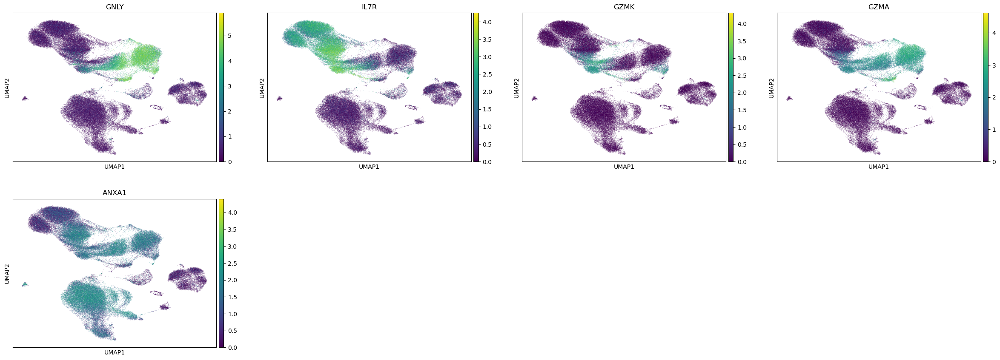

In [26]:
cd4_tem_canon = annot[(annot['Cluster']=='Clus_CD4_TEM') & (annot['Cell.Type']=='Effector memory CD4-positive, alpha-beta T cell')]['canonical.marker.overlap'].tolist()[0]
# Effector memory CD4-positive, alpha-beta T cell
print(cd4_tem_canon)
sc.pl.umap(adata, color=cd4_tem_canon)

### CD8_naive

In [27]:
annot[annot['Cluster']=='Clus_CD8_Naive']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,Clus_CD8_Naive,Naive T cell,9.120098e-35,5.864578e-38,0.377264,6/19,19/192,"[SELL, PTPRC, CD8A, CD8B, LEF1, NPM1]","[CD52, S100A6, S100A4, SELL, ZFP36L2, RPL31, E...","[NUCB2, S100A4, AIF1, CD8A, RPL36A, RPL31, EEF..."
2,Clus_CD8_Naive,"Central memory CD8-positive, alpha-beta T cell",2.702957e-30,3.176139e-32,0.047290,4/9,5/40,"[SELL, PTPRC, CD8A, CD8B]","[SELL, ZFP36L2, CD8A, CD8B, HLA-B]","[CD8A, HLA-B, ZFP36L2, SELL, PTPRC, CD8B]"
3,Clus_CD8_Naive,"Naive thymus-derived CD8-positive, alpha-beta ...",4.561786e-27,6.837543e-30,0.620482,4/13,17/179,"[SELL, CD8A, CD8B, LEF1]","[CD52, S100A4, SELL, PTPRC, ZFP36L2, CD8A, CD8...","[S100A4, AIF1, CD8A, EEF1B2, LEPROTL1, OXNAD1,..."
4,Clus_CD8_Naive,T cell,1.912079e-26,4.976039e-29,0.488934,9/221,20/225,"[CD52, SELL, PTPRC, ZFP36L2, CD8A, CD8B, LEF1,...","[CD52, S100A4, SELL, PTPRC, ZFP36L2, CD8A, CD8...","[NUCB2, S100A4, AIF1, CD8A, EEF1B2, ANXA1, LEP..."
5,Clus_CD8_Naive,Mature NK T cell,3.759814e-21,1.013504e-23,0.727273,5/39,7/141,"[CD52, SELL, PTPRC, CD8A, CD8B]","[CD52, SELL, PTPRC, ARL4C, LEF1, HLA-B, AIF1]","[AIF1, CD8A, LEF1, HLA-B, CD52, SELL, PTPRC, A..."
6,Clus_CD8_Naive,"CD8-positive, alpha-beta T cell",3.187316e-20,2.009484e-21,0.039014,4/96,11/293,"[SELL, PTPRC, CD8A, CD8B]","[CD52, S100A4, PTPRC, ZFP36L2, CD8A, CD8B, TMS...","[S100A4, CD8A, ZFP36L2, CD52, SELL, ANXA1, SAR..."
7,Clus_CD8_Naive,"Effector memory CD8-positive, alpha-beta T cell",3.419931e-20,2.173469e-21,0.045354,5/44,6/78,"[SELL, PTPRC, CD8A, CD8B, TMSB4X]","[CD52, S100A6, S100A4, CD8A, CD8B, ANXA1]","[S100A4, S100A6, CD8A, CD52, SELL, ANXA1, PTPR..."
8,Clus_CD8_Naive,"CD8-positive, alpha-beta cytotoxic T cell",1.123379e-17,5.242194e-20,0.799582,4/51,9/175,"[PTPRC, CD8A, CD8B, ANXA1]","[CD52, PTPRC, ZFP36L2, CD8A, CD8B, ARL4C, HLA-...","[CD8A, HLA-B, ZFP36L2, ANXA1, CD52, SARAF, LEP..."
9,Clus_CD8_Naive,"CD8-positive, alpha-beta memory T cell",2.085986e-17,2.831663e-19,0.314415,2/8,6/58,"[SELL, CD8A]","[CD52, S100A6, S100A4, SELL, CD8A, ARL4C]","[S100A4, S100A6, CD8A, CD52, SELL, ARL4C]"


['SELL', 'PTPRC', 'CD8A', 'CD8B', 'LEF1', 'NPM1']


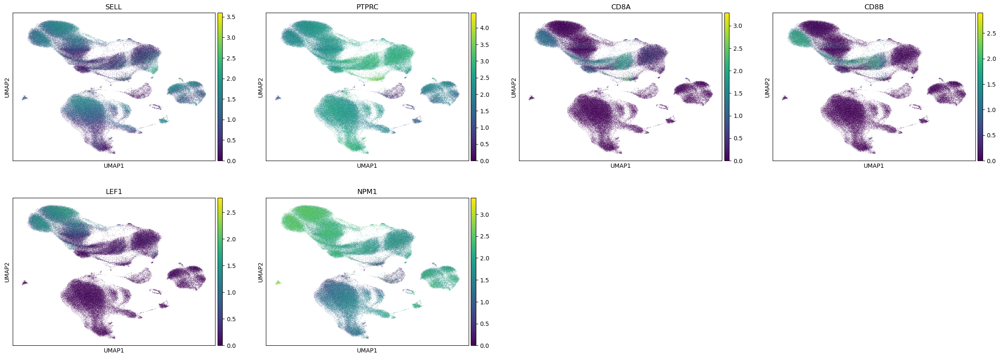

In [28]:
cd8_naive_canon = annot[(annot['Cluster']=='Clus_CD8_Naive') & (annot['Cell.Type']=='Naive T cell')]['canonical.marker.overlap'].tolist()[0]
print(cd8_naive_canon)
sc.pl.umap(adata, color=cd8_naive_canon)

### CD8_TEM

In [30]:
annot[annot['Cluster']=='Clus_CD8_TEM']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,Clus_CD8_TEM,Mature NK T cell,4.289073e-39,2.717776e-40,0.003434,8/39,12/141,"[GNLY, CD8A, CD8B, TRGC2, PRF1, KLRB1, KLRD1, ...","[CD247, GNLY, DUSP2, ACTB, TRBC2, CD3D, CD3G, ...","[CD8A, GNLY, PRF1, CD3D, CD247, TRBC2, CD8B, C..."
2,Clus_CD8_TEM,T cell,3.936023e-38,7.834753e-39,0.002254,12/221,20/225,"[CD247, GNLY, CD8A, CD8B, ACTB, TRBC2, FTH1, P...","[CD247, GNLY, CD8A, CD8B, DUSP2, PTMA, RPL32, ...","[PPP2R5C, PRF1, PTMA, CD8B, IL32, ACTB, KLRB1,..."
3,Clus_CD8_TEM,"CD8-positive, alpha-beta cytotoxic T cell",2.532159e-37,8.045377e-37,0.000217,5/51,16/175,"[GNLY, CD8A, CD8B, TRGC2, PRF1]","[CD247, GNLY, CD8A, CD8B, DUSP2, PIK3R1, TRGC2...","[PPP2R5C, CD8A, GNLY, PRF1, CD3D, PIK3R1, CD24..."
4,Clus_CD8_TEM,"CD8-positive, alpha-beta T cell",3.141291e-36,1.609555e-35,0.000185,8/96,17/293,"[GNLY, CD8A, CD8B, DUSP2, TRBC2, PRF1, KLRB1, ...","[CD247, GNLY, CD8A, CD8B, DUSP2, PIK3R1, ACTB,...","[PPP2R5C, CD8A, GNLY, PRF1, CD3D, PIK3R1, CD24..."
5,Clus_CD8_TEM,"Effector memory CD8-positive, alpha-beta T cell",3.969553e-32,1.256016e-32,0.004207,8/44,7/78,"[GNLY, CD8A, CD8B, TRGC2, PRF1, KLRB1, KLRD1, ...","[GNLY, CD8A, CD8B, EEF1A1, PRF1, KLRD1, RPL13]","[CD8A, GNLY, PRF1, TRAC, KLRB1, TRGC2, EEF1A1,..."
6,Clus_CD8_TEM,"Effector memory CD8-positive, alpha-beta T cel...",4.369805e-22,1.783738e-24,0.555779,5/14,18/167,"[GNLY, CD8A, CD8B, PRF1, KLRD1]","[GNLY, CD8A, CD8B, DUSP2, RPL32, RPS3A, PIK3R1...","[PPP2R5C, CD8A, GNLY, PRF1, PIK3R1, RPLP1, RPL..."
7,Clus_CD8_TEM,"Naive thymus-derived CD8-positive, alpha-beta ...",1.252134e-17,5.129175e-20,0.796559,2/13,14/179,"[CD8A, CD8B]","[CD8A, CD8B, DUSP2, RPL32, PIK3R1, ACTB, TRGC2...","[PPP2R5C, CD8A, RPLP1, CD3D, PIK3R1, TRBC2, CD..."
8,Clus_CD8_TEM,"Effector CD8-positive, alpha-beta T cell",1.569852e-17,2.672088e-18,NaN,3/8,0/1,"[GNLY, CD8A, CD8B]",,"[CD8A, GNLY, CD8B]"
9,Clus_CD8_TEM,"Central memory CD8-positive, alpha-beta T cell",3.509522e-16,6.720362e-17,NaN,2/9,4/40,"[CD8A, CD8B]","[CD8A, CD8B, DUSP2, KLRD1]","[CD8A, KLRD1, DUSP2, CD8B]"


['GNLY', 'CD8A', 'CD8B', 'TRGC2', 'PRF1', 'KLRB1', 'KLRD1', 'TRAC']


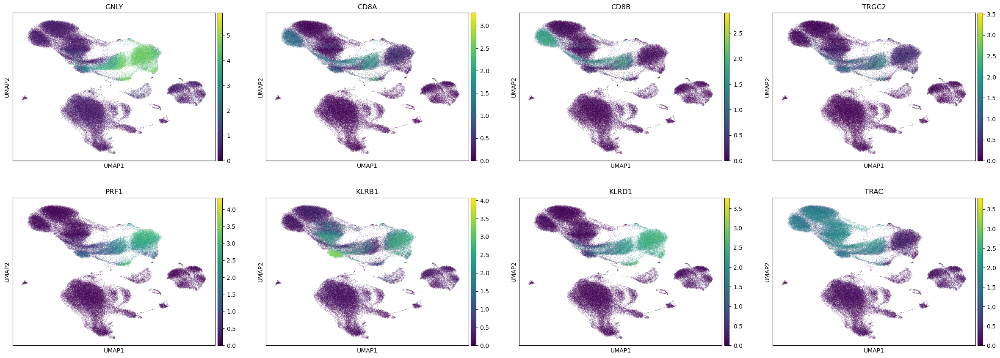

In [31]:
cd8_tem_canon = annot[(annot['Cluster']=='Clus_CD8_TEM') & (annot['Cell.Type']=='Effector memory CD8-positive, alpha-beta T cell')]['canonical.marker.overlap'].tolist()[0]
# Effector memory CD8-positive, alpha-beta T cell
print(cd8_tem_canon)
sc.pl.umap(adata, color=cd8_tem_canon)

### cDC1 and cDC2 (conventional DC)

In [34]:
annot[annot['Cluster']=='Clus_cDC1']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,Clus_cDC1,Dendritic cell,6.785735e-34,1.005242e-36,0.033333,11/143,15/307,"[S100A9, HLA-DPA1, HLA-DPB1, SNX3, CPVL, CPNE3...","[C1orf54, S100A4, ID2, HLA-DPA1, HLA-DPB1, SNX...","[S100A4, C1orf54, CLEC9A, IRF8, CST3, S100A9, ..."
2,Clus_cDC1,Monocyte,8.556634e-17,3.039475e-16,0.000052,6/218,8/365,"[S100A9, HLA-DPA1, HLA-DPB1, MALAT1, CST3, FTL]","[S100A9, S100A4, HLA-DPA1, HLA-DPB1, CPVL, ITM...","[S100A9, S100A4, HLA-DPB1, CPVL, MALAT1, ITM2B..."
3,Clus_cDC1,Type 1 conventional dendritic cell,1.028943e-11,4.649028e-12,0.000837,4/38,12/234,"[ID2, HLA-DPA1, CLEC9A, IRF8]","[C1orf54, ID2, HLA-DPA1, HLA-DPB1, SNX3, CPVL,...","[C1orf54, CLEC9A, IRF8, CST3, HLA-DPB1, CPVL, ..."
4,Clus_cDC1,"CD141-positive, CLEC9A-positive dendritic cell",3.606323e-11,5.046416e-11,0.000378,2/5,8/99,"[HLA-DPA1, CLEC9A]","[ID2, HLA-DPA1, HLA-DPB1, SNX3, CPVL, CPNE3, W...","[HLA-DPB1, CPVL, CPNE3, WDFY4, ID2, CLEC9A, HL..."
5,Clus_cDC1,CD14-positive monocyte,1.148885e-10,1.559113e-13,0.509605,2/25,5/155,"[S100A9, CPVL]","[S100A9, S100A4, CPVL, CST3, FTL]","[S100A9, S100A4, FTL, CPVL, CST3]"
6,Clus_cDC1,Classical monocyte,2.199384e-10,5.688062e-12,NaN,3/122,2/66,"[S100A9, S100A4, CST3]","[S100A9, CST3]","[S100A4, S100A9, CST3]"
7,Clus_cDC1,Suppressor macrophage,1.382500e-09,4.171338e-11,NaN,2/16,0/1,"[S100A9, CST3]",,"[S100A9, CST3]"
8,Clus_cDC1,Myeloid dendritic cell,7.493868e-09,2.584092e-10,NaN,5/63,0/1,"[S100A9, HLA-DPA1, HLA-DPB1, CLEC9A, CST3]",,"[S100A9, HLA-DPB1, CLEC9A, HLA-DPA1, CST3]"
9,Clus_cDC1,Macrophage,1.113339e-08,3.619064e-10,0.046231,8/281,13/653,"[S100A9, S100A4, HLA-DPA1, HLA-DPB1, CLEC9A, B...","[C1orf54, S100A9, S100A4, ID2, HLA-DPA1, HLA-D...","[S100A4, C1orf54, CLEC9A, IRF8, CST3, S100A9, ..."


In [35]:
annot[annot['Cluster']=='Clus_cDC2']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,Clus_cDC2,CD1c-positive myeloid dendritic cell,3.300913e-25,1.883085e-28,0.227862,5/15,8/35,"[FCER1A, HLA-DRA, LYZ, CLEC10A, CST3]","[FCER1A, HLA-DRA, HLA-DQA1, HLA-DPA1, HLA-DPB1...","[CLEC10A, HLA-DPB1, HLA-DRA, HLA-DPA1, HLA-DQA..."
2,Clus_cDC2,Monocyte,1.097312e-24,3.641648e-26,0.006024,10/218,8/365,"[HLA-DRA, HLA-DQA1, HLA-DQB1, HLA-DPA1, HLA-DP...","[HLA-DRA, HLA-DQA1, HLA-DQB1, HLA-DPA1, HLA-DP...","[CLEC10A, HLA-DPB1, HLA-DRA, MALAT1, HLA-DPA1,..."
3,Clus_cDC2,Myeloid dendritic cell,7.122145e-23,1.227956e-24,NaN,9/63,0/1,"[FCER1A, HLA-DRA, HLA-DQA1, HLA-DQB1, HLA-DPA1...",,"[CLEC10A, HLA-DPB1, HLA-DRA, HLA-DPA1, HLA-DQA..."
4,Clus_cDC2,Conventional dendritic cell,6.687912e-22,2.082082e-24,0.120085,6/22,8/99,"[FCER1A, HLA-DRA, HLA-DPB1, LYZ, CLEC10A, CST3]","[HLA-DRA, HLA-DQA1, HLA-DQB1, HLA-DPA1, HLA-DP...","[CLEC10A, HLA-DPB1, HLA-DRA, HLA-DPA1, HLA-DQA..."
5,Clus_cDC2,"Dendritic cell, human",3.040215e-19,7.862624e-21,NaN,2/6,0/1,"[FCER1A, CLEC10A]",,"[CLEC10A, FCER1A]"
6,Clus_cDC2,Macrophage,3.116237e-16,4.758447e-17,0.004492,9/281,11/653,"[HLA-DRA, HLA-DQA1, HLA-DQB1, HLA-DPA1, HLA-DP...","[FCER1A, HLA-DRA, HLA-DQA1, HLA-DQB1, HLA-DPA1...","[LYZ, CST3, CLEC10A, HLA-DPB1, B2M, HLA-DRA, H..."
7,Clus_cDC2,Type 2 conventional dendritic cell,8.307250e-16,1.349581e-17,0.049536,2/22,10/184,"[FCER1A, CLEC10A]","[FCER1A, HLA-DRA, HLA-DQA1, HLA-DQB1, HLA-DPA1...","[CLEC10A, HLA-DPB1, HLA-DRA, HLA-DPA1, HLA-DQA..."
8,Clus_cDC2,B cell,1.563132e-11,2.121809e-10,0.000098,6/169,7/264,"[HLA-DRA, HLA-DQA1, HLA-DQB1, HLA-DPA1, HLA-DP...","[HLA-DRA, HLA-DQA1, HLA-DQB1, HLA-DPA1, HLA-DP...","[HLA-DPB1, B2M, HLA-DRA, MALAT1, HLA-DPA1, HLA..."
9,Clus_cDC2,Type 1 conventional dendritic cell,5.485093e-09,2.899385e-07,0.000037,3/38,9/234,"[FCER1A, HLA-DPA1, CLEC10A]","[FCER1A, HLA-DRA, HLA-DQA1, HLA-DQB1, HLA-DPA1...","[CLEC10A, HLA-DPB1, HLA-DRA, HLA-DPA1, HLA-DQA..."


In [51]:
cdc1_canon = annot[(annot['Cluster']=='Clus_cDC1') & (annot['Cell.Type']=='Type 1 conventional dendritic cell')]['canonical.marker.overlap'].tolist()[0]
cdc2_canon = annot[(annot['Cluster']=='Clus_cDC2') & (annot['Cell.Type']=='Type 2 conventional dendritic cell')]['canonical.marker.overlap'].tolist()[0]
cdc_canon = annot[(annot['Cluster']=='Clus_cDC2') & (annot['Cell.Type']=='Conventional dendritic cell')]['canonical.marker.overlap'].tolist()[0]
print('cDC1:', cdc1_canon)
print('cDC2:', cdc2_canon)
print('cDC:', cdc_canon)

cDC1: ['ID2', 'HLA-DPA1', 'CLEC9A', 'IRF8']
cDC2: ['FCER1A', 'CLEC10A']
cDC: ['FCER1A', 'HLA-DRA', 'HLA-DPB1', 'LYZ', 'CLEC10A', 'CST3']


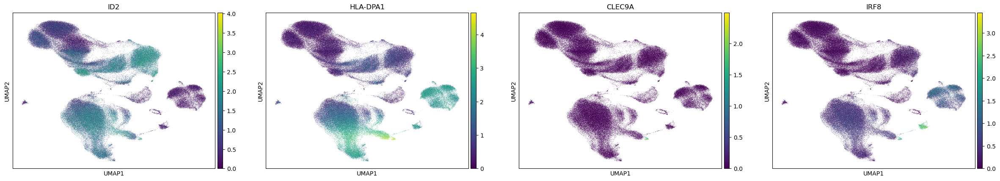

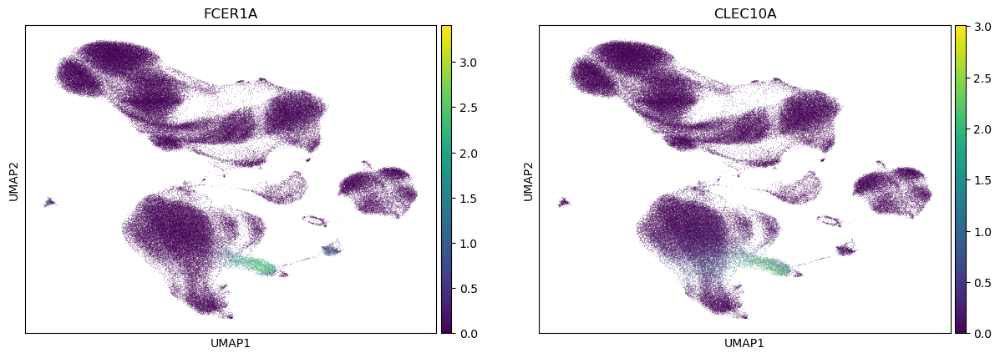

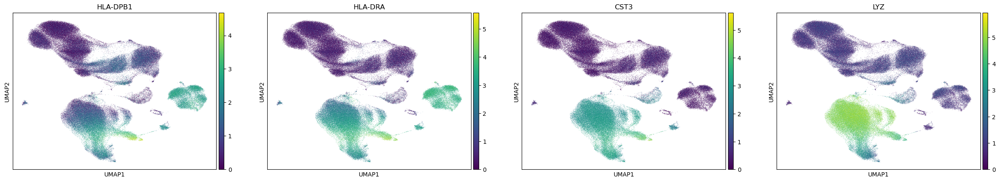

In [56]:
sc.pl.umap(adata, color=cdc1_canon)
sc.pl.umap(adata, color=cdc2_canon)
sc.pl.umap(adata, color=list(set(cdc_canon) - set(cdc2_canon) - set(cdc1_canon)))

### gdT

In [37]:
annot[annot['Cluster']=='Clus_gdT']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,Clus_gdT,Mature NK T cell,1.658965e-26,9.468582e-29,0.054471,8/39,11/141,"[GNLY, IL7R, TRGC2, TRGC1, TRDC, IL32, CCL5, T...","[GNLY, DUSP2, IL7R, ACTB, MALAT1, CD3E, CD3D, ...","[GNLY, CD3D, TRGC1, CD3G, IL7R, IL32, MALAT1, ..."
2,Clus_gdT,T cell,7.541858e-19,5.931243e-19,0.001087,8/221,14/225,"[GNLY, IL7R, ACTB, TRGC1, MALAT1, TRDC, IL32, ...","[GNLY, DUSP2, IL7R, TRGC2, TMSB4X, CD3E, CD3D,...","[PPP2R5C, GNLY, CD3D, TRGC1, RPS26, CD3G, IL7R..."
3,Clus_gdT,"CD8-positive, alpha-beta cytotoxic T cell",8.010543e-18,2.549740e-18,0.004270,5/51,14/175,"[GNLY, TRGC2, TRGC1, TRDC, CCL5]","[GNLY, DUSP2, IL7R, TRGC2, TRGC1, MALAT1, CD3E...","[PPP2R5C, GNLY, CD3D, TRGC1, CD3G, IL7R, IL32,..."
4,Clus_gdT,Gamma-delta T cell,1.851028e-16,4.307498e-16,0.000841,5/35,15/308,"[IL7R, TRGC2, TRGC1, TRDC, CCL5]","[GNLY, DUSP2, IL7R, TRGC2, TRGC1, MALAT1, CD3E...","[GNLY, RPLP1, CD3D, TRGC1, MT-CO1, CD3G, IL7R,..."
5,Clus_gdT,"Effector memory CD8-positive, alpha-beta T cell",2.815446e-14,2.995155e-15,NaN,5/44,4/78,"[GNLY, IL7R, TRGC2, TMSB4X, CCL5]","[GNLY, IL7R, B2M, CCL5]","[IL7R, GNLY, B2M, TRGC2, TMSB4X, CCL5]"
6,Clus_gdT,"Effector memory CD8-positive, alpha-beta T cel...",8.988717e-14,3.439227e-15,0.090909,2/14,10/167,"[GNLY, CCL5]","[GNLY, DUSP2, IL7R, ACTB, TMSB4X, PPP2R5C, B2M...","[PPP2R5C, IL7R, GNLY, RPLP1, B2M, DUSP2, ACTB,..."
7,Clus_gdT,"Central memory CD4-positive, alpha-beta T cell",4.186085e-13,6.234595e-14,NaN,4/25,0/1,"[TMSB10, IL7R, IL32, TYROBP]",,"[TMSB10, IL7R, IL32, TYROBP]"
8,Clus_gdT,Helper T cell,5.243367e-13,2.126928e-12,0.001213,3/57,7/159,"[IL7R, NEAT1, IL32]","[IL7R, NEAT1, MALAT1, CD3E, CD3D, CD3G, IL32]","[CD3G, IL7R, IL32, CD3D, MALAT1, CD3E, NEAT1]"
9,Clus_gdT,"Effector memory CD4-positive, alpha-beta T cell",1.199242e-12,2.296421e-13,NaN,3/26,0/1,"[GNLY, IL7R, CCL5]",,"[IL7R, GNLY, CCL5]"


['IL7R', 'TRGC2', 'TRGC1', 'TRDC', 'CCL5']


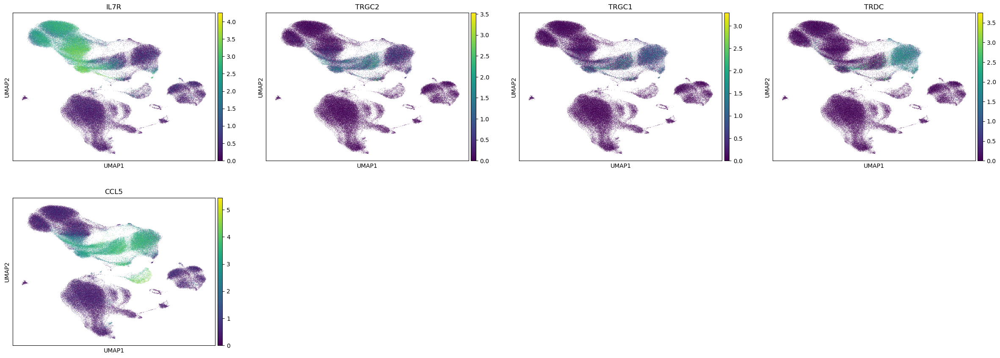

In [38]:
gdt_canon = annot[(annot['Cluster']=='Clus_gdT') & (annot['Cell.Type']=='Gamma-delta T cell')]['canonical.marker.overlap'].tolist()[0]
print(gdt_canon)
sc.pl.umap(adata, color=gdt_canon)

### HSPC

In [40]:
annot[annot['Cluster']=='Clus_HSPC']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,Clus_HSPC,Progenitor cell,9.074578e-09,1.452461e-11,0.095133,4/178,7/479,"[STMN1, SPINK2, SOX4, CDK6]","[STMN1, S100A6, SPINK2, SERPINB1, SOX4, HLA-B,...","[SOX4, S100A6, CDK6, ZFAS1, SERPINB1, STMN1, S..."
2,Clus_HSPC,Macrophage,2.263067e-04,7.237515e-07,0.331933,5/281,7/653,"[STMN1, S100A6, ANKRD28, BTG1, B2M]","[STMN1, S100A6, SERPINB1, HLA-B, TMSB4X, BTG1,...","[S100A6, B2M, BTG1, ANKRD28, STMN1, SERPINB1, ..."
3,Clus_HSPC,Hematopoietic stem cell,4.774266e-04,1.028937e-05,NaN,2/88,3/125,"[SPINK2, SOX4]","[ANKRD28, SPINK2, SERPINB1]","[SOX4, ANKRD28, SERPINB1, SPINK2]"
4,Clus_HSPC,Megakaryocyte-erythroid progenitor cell,1.571342e-03,4.063815e-05,NaN,2/19,1/67,"[SOX4, CDK6]",[SERPINB1],"[SOX4, SERPINB1, CDK6]"
5,Clus_HSPC,Neuron,3.321814e-03,6.539863e-04,0.013891,2/174,5/288,"[SOX4, B2M]","[STMN1, S100A6, SOX4, TMSB4X, ZFAS1]","[SOX4, S100A6, STMN1, TMSB4X, B2M, ZFAS1]"
6,Clus_HSPC,Fibroblast,4.208862e-02,2.467093e-04,0.942045,3/309,5/687,"[STMN1, S100A6, SOX4]","[STMN1, S100A6, SOX4, TMSB4X, B2M]","[S100A6, SOX4, B2M, STMN1, TMSB4X]"


['SPINK2', 'SOX4']


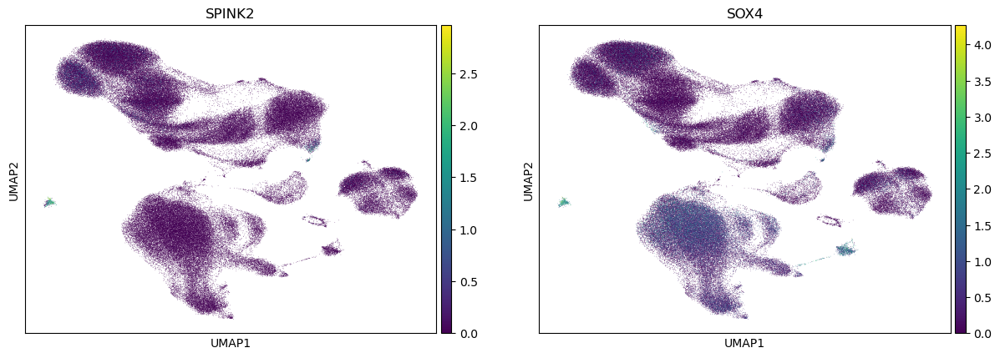

In [41]:
hspc_canon = annot[(annot['Cluster']=='Clus_HSPC') & (annot['Cell.Type']=='Hematopoietic stem cell')]['canonical.marker.overlap'].tolist()[0]
print(hspc_canon)
sc.pl.umap(adata, color=hspc_canon)

### MAIT

In [42]:
annot[annot['Cluster']=='Clus_MAIT']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,Clus_MAIT,"Effector memory CD8-positive, alpha-beta T cell",6.701479e-20,1.425847e-21,NaN,5/44,2/78,"[CXCR4, IL7R, GZMK, TMSB4X, KLRB1]","[IL7R, GZMK]","[IL7R, GZMK, KLRB1, TMSB4X, CXCR4]"
2,Clus_MAIT,"Effector memory CD4-positive, alpha-beta T cell",7.444637e-17,3.167930e-18,NaN,4/26,0/1,"[CXCR4, IL7R, GZMK, KLRB1]",,"[IL7R, GZMK, KLRB1, CXCR4]"
3,Clus_MAIT,T cell,1.704285e-16,9.359740e-18,0.026511,7/221,8/225,"[CXCR4, IL7R, GZMK, NCR3, MALAT1, KLRB1, KLF2]","[RPS27, DUSP2, CXCR4, IL7R, GZMK, TMSB4X, KLRB...","[IL7R, GZMK, MALAT1, DUSP2, KLF2, KLRB1, RPS27..."
4,Clus_MAIT,Helper T cell,1.024866e-13,1.441293e-14,0.016363,4/57,5/159,"[CXCR4, IL7R, GZMK, KLRB1]","[RPS27, CXCR4, IL7R, MALAT1, KLRB1]","[IL7R, GZMK, MALAT1, KLRB1, RPS27, CXCR4]"
5,Clus_MAIT,Memory T cell,1.988645e-13,9.140044e-13,0.000642,3/16,6/214,"[IL7R, KLRB1, KLF2]","[RPS27, DUSP2, CXCR4, IL7R, GZMK, MALAT1]","[IL7R, GZMK, MALAT1, DUSP2, KLRB1, RPS27, KLF2..."
6,Clus_MAIT,Mucosal invariant T cell,3.410525e-13,1.907301e-11,0.000065,4/17,7/81,"[CXCR4, IL7R, NCR3, KLRB1]","[TMSB10, DUSP2, CXCR4, IL7R, GZMK, NCR3, KLRB1]","[IL7R, GZMK, TMSB10, DUSP2, KLRB1, NCR3, CXCR4]"
7,Clus_MAIT,"Central memory CD4-positive, alpha-beta T cell",6.575762e-11,9.793688e-12,NaN,3/25,0/1,"[TMSB10, IL7R, KLF2]",,"[TMSB10, IL7R, KLF2]"
8,Clus_MAIT,"CD4-positive, alpha-beta T cell",1.338010e-09,5.331423e-11,0.161326,3/93,7/281,"[IL7R, GZMK, KLRB1]","[RPS27, DUSP2, CXCR4, IL7R, GZMK, MALAT1, KLRB1]","[IL7R, GZMK, MALAT1, DUSP2, KLRB1, RPS27, CXCR4]"
9,Clus_MAIT,T-helper 17 cell,8.627847e-09,1.835712e-09,NaN,2/31,0/1,"[IL7R, KLRB1]",,"[IL7R, KLRB1]"


['CXCR4', 'IL7R', 'NCR3', 'KLRB1']


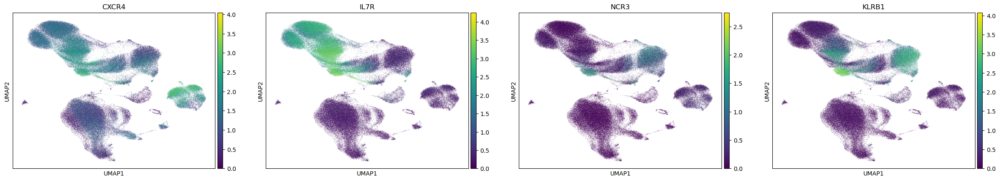

In [43]:
mait_canon = annot[(annot['Cluster']=='Clus_MAIT') & (annot['Cell.Type']=='Mucosal invariant T cell')]['canonical.marker.overlap'].tolist()[0]
print(mait_canon)
sc.pl.umap(adata, color=mait_canon)

### NK

In [45]:
annot[annot['Cluster']=='Clus_NK']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,Clus_NK,Natural killer cell,4.211815e-60,1.420970e-55,8.623012e-10,14/150,19/223,"[FCER1G, FCGR3A, CD247, GNLY, SPON2, PRF1, KLR...","[CD52, FCER1G, FCGR3A, CD247, GNLY, PTMA, SPON...","[CLIC3, PRF1, SPON2, PTMA, GZMB, KLRB1, KLRF1,..."
2,Clus_NK,Mature NK T cell,8.630522e-49,5.024854e-51,1.221440e-02,12/42,14/141,"[CD52, FCER1G, FCGR3A, GNLY, PRF1, KLRB1, KLRF...","[CD52, FCGR3A, CD247, GNLY, CLIC3, MALAT1, PRF...","[GNLY, CLIC3, PRF1, NKG7, CD247, FCGR3A, FCER1..."
3,Clus_NK,Circulating natural killer cell,1.216498e-33,7.501802e-35,2.450028e-03,6/12,13/87,"[FCGR3A, GNLY, KLRD1, GZMB, TYROBP, NKG7]","[FCER1G, FCGR3A, GNLY, SPON2, CLIC3, PRF1, KLR...","[GNLY, CLIC3, PRF1, NKG7, FCGR3A, SPON2, FCER1..."
4,Clus_NK,"CD8-positive, alpha-beta cytotoxic T cell",9.722332e-28,2.683341e-29,8.733482e-03,8/54,14/175,"[FCGR3A, GNLY, VIM, PRF1, GZMB, CD7, CST7, NKG7]","[CD52, FCGR3A, CD247, GNLY, MALAT1, PRF1, KLRB...","[GNLY, PRF1, NKG7, CD247, FCGR3A, VIM, CD7, B2..."
5,Clus_NK,"Effector memory CD8-positive, alpha-beta T cel...",1.111931e-22,2.344567e-25,1.718593e-01,5/14,18/167,"[GNLY, PRF1, KLRD1, GZMB, NKG7]","[CD52, RPS8, FCGR3A, GNLY, TMSB4X, RPL39, PRF1...","[RPS8, GNLY, RPLP1, PRF1, NKG7, FCGR3A, RPLP0,..."
6,Clus_NK,Monocyte,4.298806e-20,1.610681e-22,1.296892e-01,11/218,8/365,"[CD52, FCER1G, FCGR3A, GNLY, FTH1, MALAT1, KLR...","[CD52, FCER1G, FCGR3A, GNLY, FTH1, VIM, TYROBP...","[GNLY, NKG7, FCGR3A, VIM, FTH1, FCER1G, MALAT1..."
7,Clus_NK,CD16-positive natural killer cell,1.543388e-19,4.656773e-21,NaN,3/3,0/1,"[FCGR3A, GNLY, NKG7]",,"[GNLY, NKG7, FCGR3A]"
8,Clus_NK,T cell,3.888971e-18,1.522146e-20,1.822759e-01,14/224,15/225,"[CD52, FCGR3A, CD247, GNLY, FTH1, MALAT1, VIM,...","[CD52, RPS8, CD247, GNLY, PTMA, TMSB4X, VIM, P...","[RPS8, GNLY, PRF1, NKG7, CD247, FCGR3A, VIM, F..."
9,Clus_NK,"CD16-positive, CD56-dim natural killer cell, h...",2.357250e-17,9.144503e-19,NaN,3/4,0/1,"[FCGR3A, GNLY, NKG7]",,"[GNLY, NKG7, FCGR3A]"


['FCER1G', 'FCGR3A', 'CD247', 'GNLY', 'SPON2', 'PRF1', 'KLRB1', 'KLRF1', 'KLRD1', 'GZMB', 'CD7', 'CST7', 'TYROBP', 'NKG7']


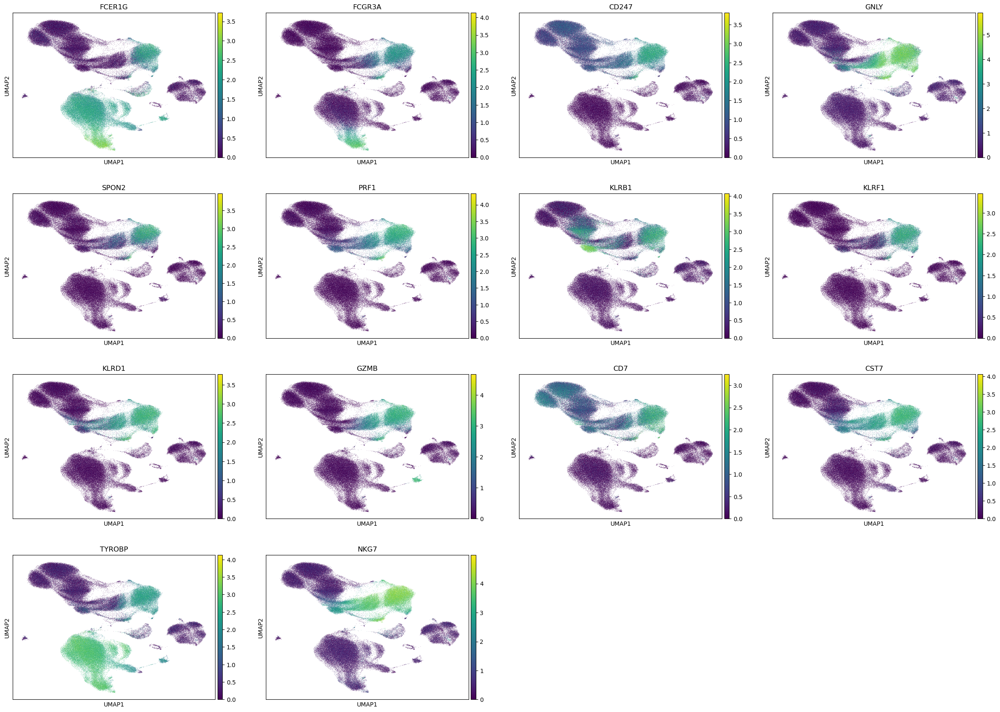

In [46]:
NK_canon = annot[(annot['Cluster']=='Clus_NK') & (annot['Cell.Type']=='Natural killer cell')]['canonical.marker.overlap'].tolist()[0]
print(NK_canon)
sc.pl.umap(adata, color=NK_canon)

### pDC

In [47]:
annot[annot['Cluster']=='Clus_pDC']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,Clus_pDC,Plasmacytoid dendritic cell,4.651354e-35,1.863119e-34,0.000012,7/93,9/295,"[ITM2C, CCDC50, JCHAIN, IRF7, GZMB, IRF8, TCF4]","[ITM2C, CCDC50, JCHAIN, UGCG, IRF7, PPP1R14B, ...","[ITM2C, IRF7, TCF4, UGCG, JCHAIN, IRF8, CCDC50..."
2,Clus_pDC,Plasma cell,1.811010e-09,1.561216e-11,NaN,3/64,3/333,"[JCHAIN, GZMB, TCF4]","[ITM2C, JCHAIN, B2M]","[GZMB, TCF4, ITM2C, B2M, JCHAIN]"
3,Clus_pDC,Dendritic cell,1.324685e-04,3.519554e-07,0.594249,5/143,8/307,"[JCHAIN, IRF7, GZMB, IRF8, TCF4]","[HLA-A, TMSB4X, UGCG, IRF7, PPP1R14B, B2M, IRF...","[B2M, IRF7, GZMB, TCF4, HLA-A, TMSB4X, UGCG, J..."
4,Clus_pDC,"Plasmacytoid dendritic cell, human",4.859627e-04,1.675734e-05,NaN,2/5,0/1,"[CCDC50, IRF7]",,"[IRF7, CCDC50]"
5,Clus_pDC,B cell,1.264131e-03,2.362682e-05,0.153433,4/169,8/264,"[ITM2C, JCHAIN, GZMB, MT-ND3]","[CCDC50, JCHAIN, HLA-A, MALAT1, B2M, IRF8, TCF...","[ITM2C, B2M, MALAT1, GZMB, TCF4, HLA-A, JCHAIN..."
6,Clus_pDC,Endothelial cell,2.397852e-03,1.136913e-04,NaN,5/466,6/268,"[ITM2C, JCHAIN, HLA-A, MALAT1, B2M]","[TXNIP, HLA-A, TMSB4X, MALAT1, B2M, TCF4]","[ITM2C, B2M, MALAT1, TXNIP, TCF4, HLA-A, TMSB4..."
7,Clus_pDC,Natural killer cell,4.702918e-03,1.503651e-04,0.137232,2/150,5/223,"[TXNIP, GZMB]","[TXNIP, HLA-A, TMSB4X, MALAT1, GZMB]","[GZMB, MALAT1, HLA-A, TMSB4X, TXNIP]"
8,Clus_pDC,Granulocyte,1.180218e-02,7.122005e-04,NaN,2/69,0/40,"[JCHAIN, TCF4]",,"[JCHAIN, TCF4]"


['ITM2C', 'CCDC50', 'JCHAIN', 'IRF7', 'GZMB', 'IRF8', 'TCF4']


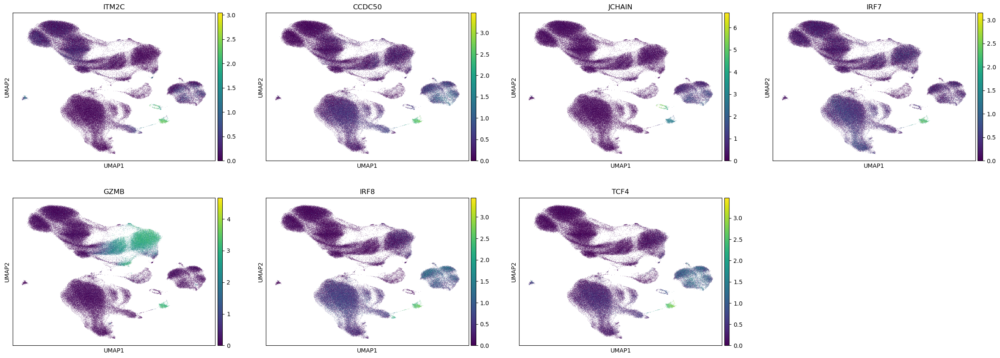

In [48]:
pDC_canon = annot[(annot['Cluster']=='Clus_pDC') & (annot['Cell.Type']=='Plasmacytoid dendritic cell')]['canonical.marker.overlap'].tolist()[0]
print(pDC_canon)
sc.pl.umap(adata, color=pDC_canon)

### Treg

In [49]:
annot[annot['Cluster']=='Clus_Treg']

,Cluster,Cell.Type,Padj,whg.p,gsea.p,Over.Markers.whg,Over.Markers.gsea,canonical.marker.overlap,gsea.DEG.overlap,union
Order,,,,,,,,,,
1,Clus_Treg,"CD4-positive, alpha-beta memory T cell",0.002015,0.000083,NaN,2/13,4/44,"[S100A4, SELL]","[RCAN3, TXNIP, PBXIP1, SELL]","[SELL, S100A4, PBXIP1, RCAN3, TXNIP]"
2,Clus_Treg,"Central memory CD8-positive, alpha-beta T cell",0.002015,0.000024,NaN,2/12,1/40,"[SELL, PTPRC]",[SELL],"[SELL, PTPRC]"
3,Clus_Treg,Macrophage,0.002015,0.000009,0.345729,6/281,13/653,"[LAPTM5, CTSS, S100A6, S100A4, RPS27, PTPRC]","[TNFRSF1B, CAPZB, SH3BGRL3, LAPTM5, TXNIP, CTS...","[S100A4, TXNIP, TPM3, CTSS, LAPTM5, SH3BGRL3, ..."
4,Clus_Treg,Memory B cell,0.002015,0.000093,NaN,3/39,2/44,"[S100A10, S100A4, SELL]","[TXNIP, SELL]","[SELL, S100A4, S100A10, TXNIP]"
5,Clus_Treg,Memory T cell,0.002015,0.000254,0.020983,2/19,5/214,"[S100A4, PTPRC]","[EPB41, LCK, TXNIP, RPS27, PTPRC]","[S100A4, LCK, EPB41, PTPRC, RPS27, TXNIP]"
6,Clus_Treg,Monocyte,0.002015,0.000020,0.279094,5/218,11/365,"[TNFRSF1B, CTSS, S100A6, SELL, PTPRC]","[TNFRSF1B, SH3BGRL3, LAPTM5, SMAP2, TXNIP, CTS...","[S100A4, TXNIP, CTSS, LAPTM5, SH3BGRL3, S100A6..."
7,Clus_Treg,Naive regulatory T cell,0.002015,0.000069,NaN,2/11,0/1,"[SELL, PTPRC]",,"[SELL, PTPRC]"
8,Clus_Treg,"Naive thymus-derived CD4-positive, alpha-beta ...",0.002037,0.000105,NaN,2/16,4/111,"[SELL, PTPRC]","[RCAN3, TXNIP, S100A4, SELL]","[SELL, S100A4, PTPRC, RCAN3, TXNIP]"
9,Clus_Treg,Myeloid suppressor cell,0.002473,0.003574,0.003389,2/41,14/446,"[SELL, PTPRC]","[TNFRSF1B, RPL11, SH3BGRL3, LAPTM5, SMAP2, RPS...","[S100A4, TPM3, CTSS, LAPTM5, SH3BGRL3, S100A10..."


['SELL', 'PTPRC']


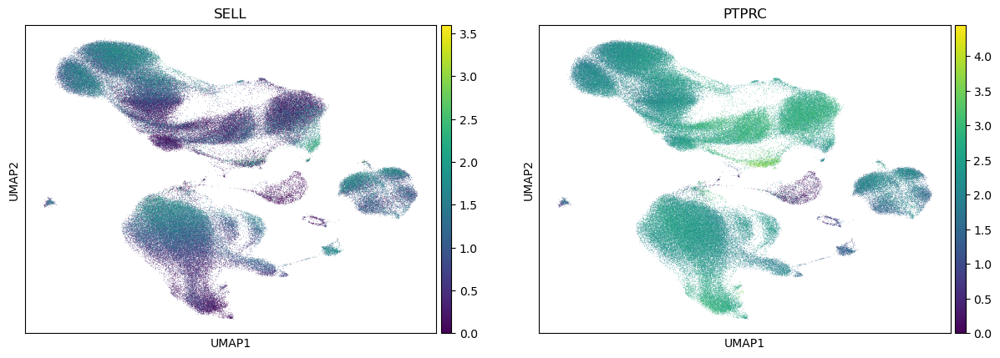

In [50]:
Treg_canon = annot[(annot['Cluster']=='Clus_Treg') & (annot['Cell.Type']=='Naive regulatory T cell')]['canonical.marker.overlap'].tolist()[0]
print(Treg_canon)
sc.pl.umap(adata, color=Treg_canon)